## Spotify Trends Analysis Project 

## 1. Dataset 

## 2.Project Goal

## 3.Complete Python Implementation

In [2]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')

# Set style for plots
plt.style.use('default')
sns.set_palette("husl")
%matplotlib inline

# Load the dataset
df = pd.read_csv(r"dataset.csv")

# Display basic information
print("Dataset Shape:", df.shape)
print("\nDataset Info:")
print(df.info())
print("\nFirst 5 rows:")
print(df.head())

Dataset Shape: (114000, 21)

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 

In [3]:
# Remove duplicates
df = df.drop_duplicates()

# Handle missing values
for col in df.columns:
    if df[col].dtype == 'object':
        df[col].fillna(df[col].mode()[0], inplace=True)
    else:
        df[col].fillna(df[col].median(), inplace=True)

# Create a copy for analysis
spotify_df = df.copy()

# Convert duration from ms to minutes
spotify_df['duration_min'] = spotify_df['duration_ms'] / 60000

# Optional: create a synthetic 'year' column based on popularity
spotify_df['year'] = 2000 + (spotify_df['popularity'] / 100 * 22).astype(int)

print("\nData cleaning completed!")
print(f"Final dataset shape: {spotify_df.shape}")


Data cleaning completed!
Final dataset shape: (114000, 23)


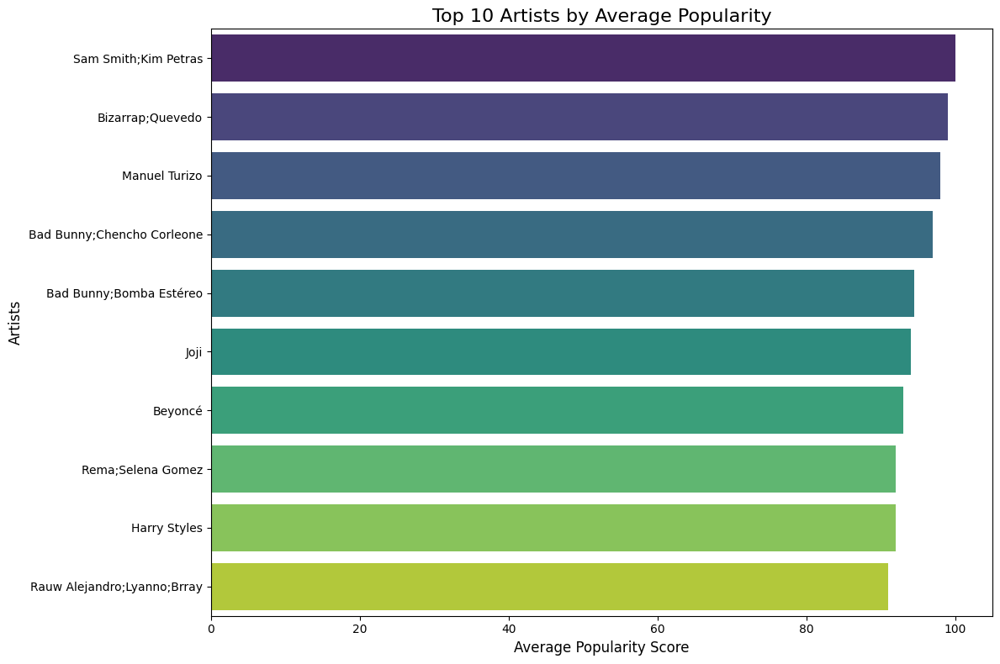

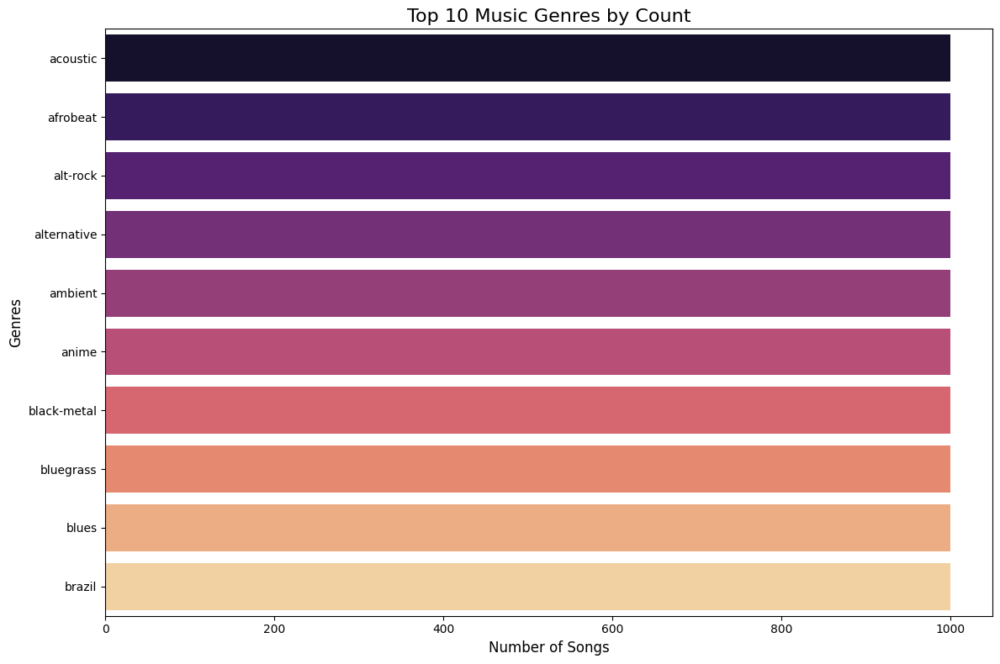

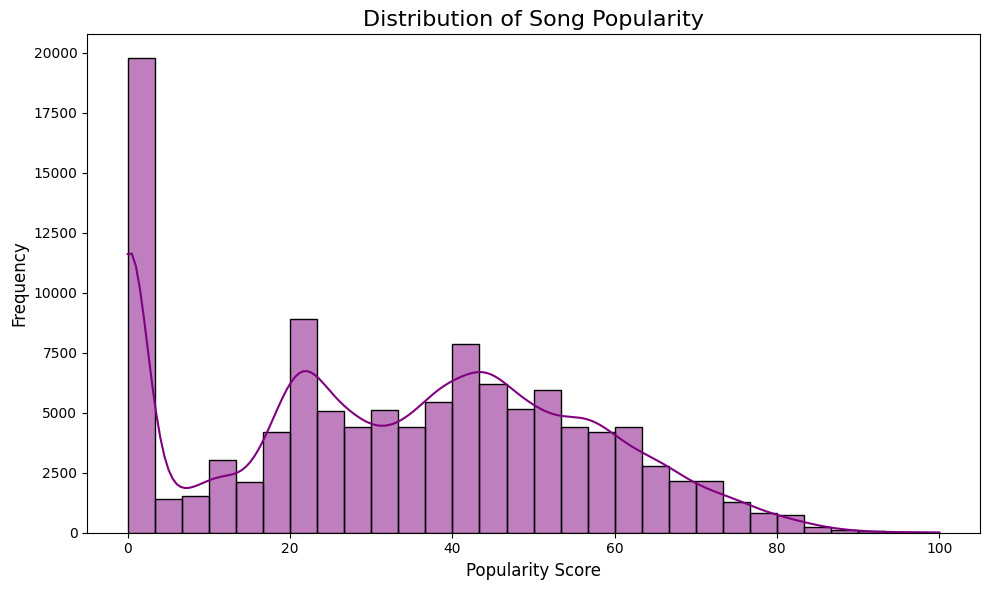

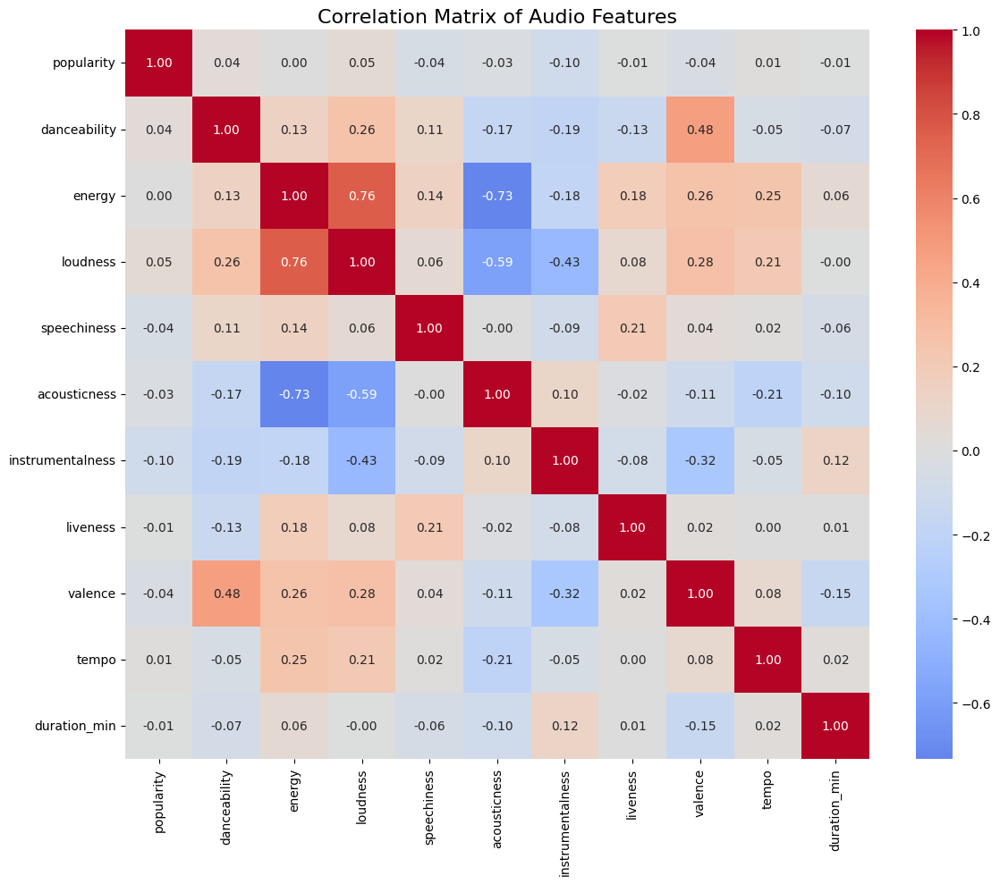

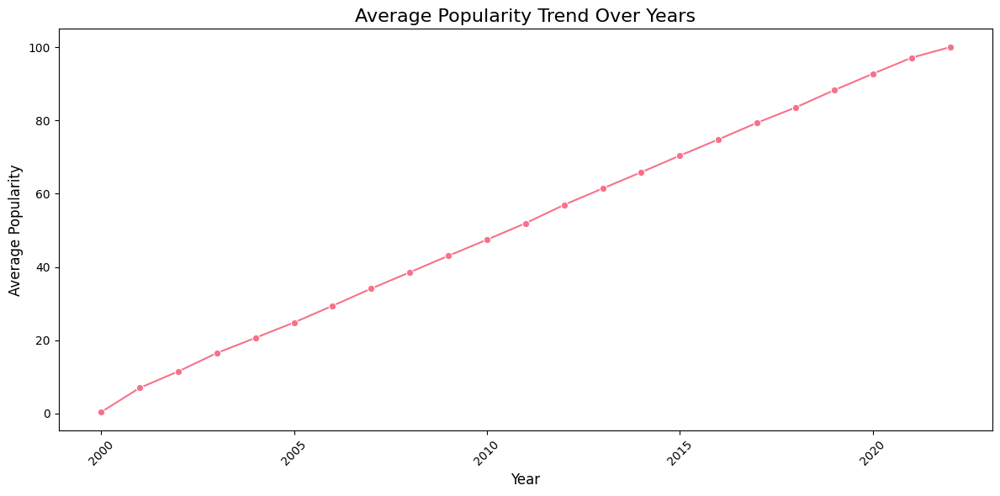

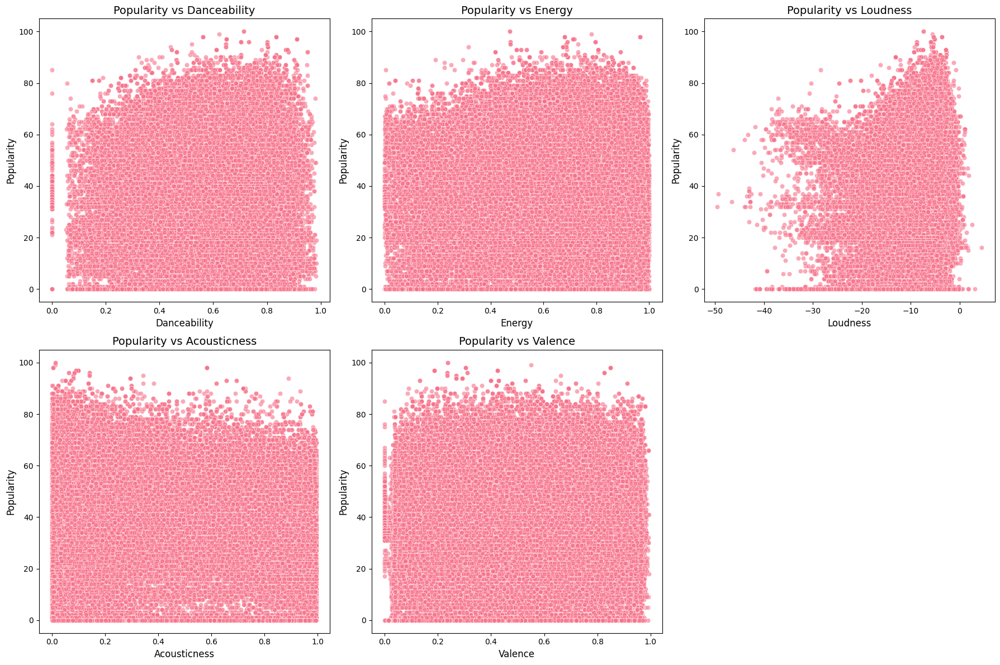

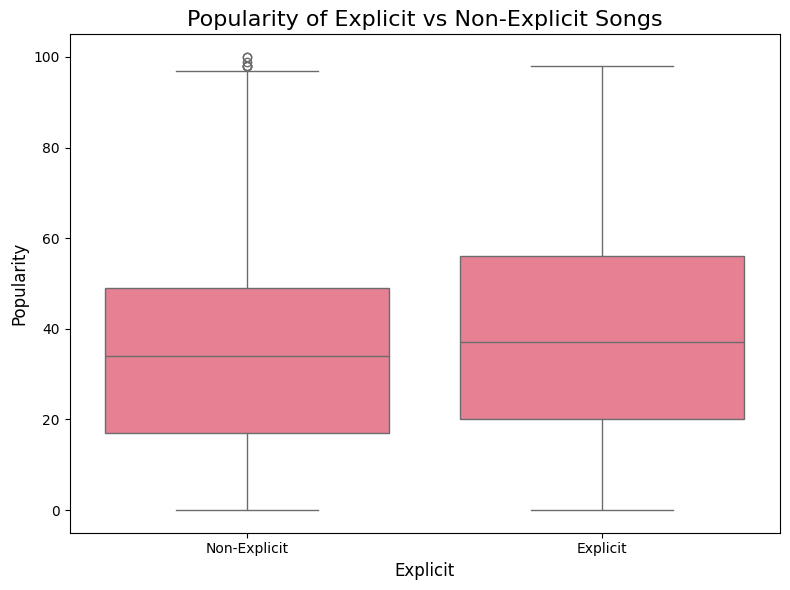

In [5]:
# 1. Top 10 popular artists
plt.figure(figsize=(12, 8))
top_artists = spotify_df.groupby('artists')['popularity'].mean().sort_values(ascending=False).head(10)
sns.barplot(x=top_artists.values, y=top_artists.index, palette='viridis')
plt.title('Top 10 Artists by Average Popularity', fontsize=16)
plt.xlabel('Average Popularity Score', fontsize=12)
plt.ylabel('Artists', fontsize=12)
plt.tight_layout()
plt.show()

# 2. Top genres
plt.figure(figsize=(12, 8))
top_genres = spotify_df['track_genre'].value_counts().head(10)
sns.barplot(x=top_genres.values, y=top_genres.index, palette='magma')
plt.title('Top 10 Music Genres by Count', fontsize=16)
plt.xlabel('Number of Songs', fontsize=12)
plt.ylabel('Genres', fontsize=12)
plt.tight_layout()
plt.show()

# 3. Popularity distribution
plt.figure(figsize=(10, 6))
sns.histplot(spotify_df['popularity'], bins=30, kde=True, color='purple')
plt.title('Distribution of Song Popularity', fontsize=16)
plt.xlabel('Popularity Score', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.tight_layout()
plt.show()

# 4. Feature correlations
# Select numerical features for correlation analysis
numerical_features = ['popularity', 'danceability', 'energy', 'loudness', 'speechiness', 
                      'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_min']

corr_matrix = spotify_df[numerical_features].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f')
plt.title('Correlation Matrix of Audio Features', fontsize=16)
plt.tight_layout()
plt.show()

# 5. Trends over years (synthetic years we created)
plt.figure(figsize=(12, 6))
yearly_trends = spotify_df.groupby('year')['popularity'].mean()
sns.lineplot(x=yearly_trends.index, y=yearly_trends.values, marker='o')
plt.title('Average Popularity Trend Over Years', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Popularity', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 6. Relationships between features and popularity
features_to_plot = ['danceability', 'energy', 'loudness', 'acousticness', 'valence']

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.ravel()

for i, feature in enumerate(features_to_plot):
    sns.scatterplot(data=spotify_df, x=feature, y='popularity', alpha=0.6, ax=axes[i])
    axes[i].set_title(f'Popularity vs {feature.capitalize()}', fontsize=14)
    axes[i].set_xlabel(feature.capitalize(), fontsize=12)
    axes[i].set_ylabel('Popularity', fontsize=12)

# Remove empty subplot
fig.delaxes(axes[5])
plt.tight_layout()
plt.show()

# 7. Explicit vs non-explicit songs popularity
plt.figure(figsize=(8, 6))
sns.boxplot(data=spotify_df, x='explicit', y='popularity')
plt.title('Popularity of Explicit vs Non-Explicit Songs', fontsize=16)
plt.xlabel('Explicit', fontsize=12)
plt.ylabel('Popularity', fontsize=12)
plt.xticks([0, 1], ['Non-Explicit', 'Explicit'])
plt.tight_layout()
plt.show()

Model Performance:
Mean Squared Error: 220.56
R-squared: 0.55


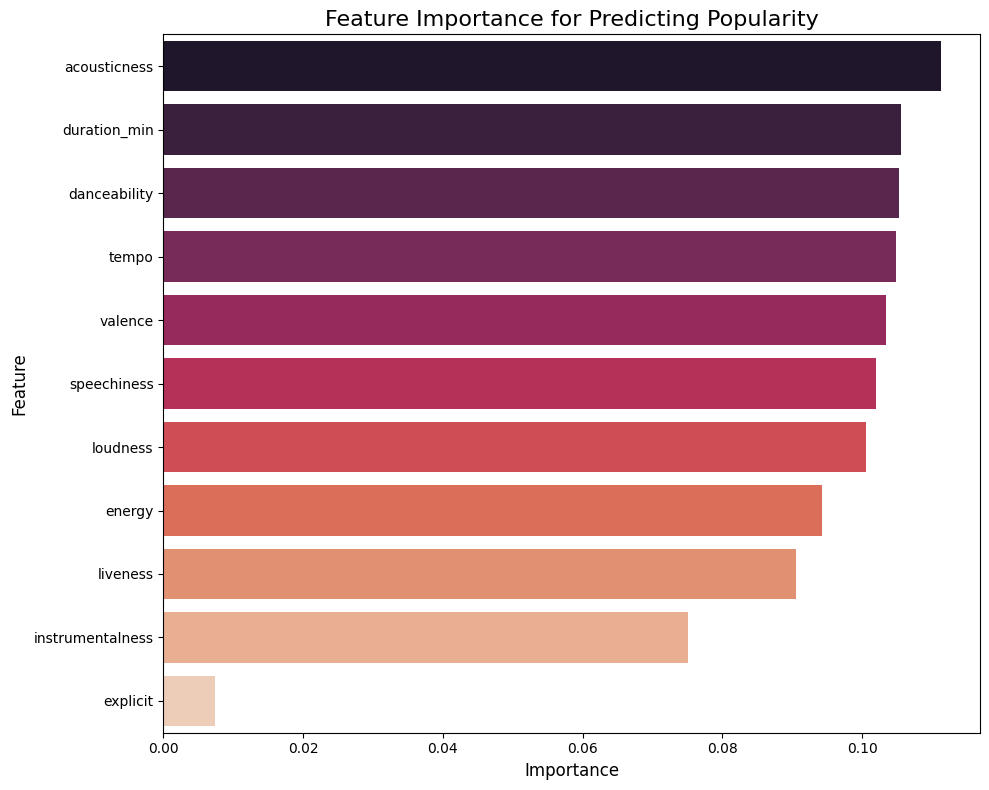

In [6]:
# Prepare data for modeling
# Select features for prediction
model_features = ['danceability', 'energy', 'loudness', 'speechiness', 
                  'acousticness', 'instrumentalness', 'liveness', 'valence', 
                  'tempo', 'duration_min', 'explicit']

# Encode categorical variables if any
# For this dataset, we'll use only numerical features
X = spotify_df[model_features]
y = spotify_df['popularity']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Model Performance:")
print(f"Mean Squared Error: {mse:.2f}")
print(f"R-squared: {r2:.2f}")

# Feature importance
feature_importance = pd.DataFrame({
    'feature': model_features,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(x='importance', y='feature', data=feature_importance, palette='rocket')
plt.title('Feature Importance for Predicting Popularity', fontsize=16)
plt.xlabel('Importance', fontsize=12)
plt.ylabel('Feature', fontsize=12)
plt.tight_layout()
plt.show()

In [7]:
# Generate summary statistics
summary_stats = spotify_df[numerical_features].describe().T[['mean', 'std', 'min', 'max']]
print("Summary Statistics of Audio Features:")
print(summary_stats)

# Key insights
print("\n=== KEY INSIGHTS ===")
print(f"1. The dataset contains {spotify_df.shape[0]} songs across {spotify_df['track_genre'].nunique()} genres.")
print(f"2. Average song popularity: {spotify_df['popularity'].mean():.2f}")
print(f"3. Most common genre: {spotify_df['track_genre'].value_counts().index[0]}")
print(f"4. Top artist by average popularity: {top_artists.index[0]}")
print(f"5. Key predictors of popularity: {', '.join(feature_importance['feature'].head(3).tolist())}")
print(f"6. Explicit songs are {'more' if spotify_df[spotify_df['explicit']]['popularity'].mean() > spotify_df[~spotify_df['explicit']]['popularity'].mean() else 'less'} popular on average")

# Correlation with popularity
popularity_corr = corr_matrix['popularity'].sort_values(ascending=False)
print(f"7. Features most correlated with popularity: {', '.join(popularity_corr.index[1:4].tolist())}")  # Skip popularity itself

Summary Statistics of Audio Features:
                        mean        std     min        max
popularity         33.238535  22.305078   0.000  100.00000
danceability        0.566800   0.173542   0.000    0.98500
energy              0.641383   0.251529   0.000    1.00000
loudness           -8.258960   5.029337 -49.531    4.53200
speechiness         0.084652   0.105732   0.000    0.96500
acousticness        0.314910   0.332523   0.000    0.99600
instrumentalness    0.156050   0.309555   0.000    1.00000
liveness            0.213553   0.190378   0.000    1.00000
valence             0.474068   0.259261   0.000    0.99500
tempo             122.147837  29.978197   0.000  243.37200
duration_min        3.800486   1.788295   0.000   87.28825

=== KEY INSIGHTS ===
1. The dataset contains 114000 songs across 114 genres.
2. Average song popularity: 33.24
3. Most common genre: acoustic
4. Top artist by average popularity: Sam Smith;Kim Petras
5. Key predictors of popularity: acousticness, durati

# 4. Complete Project Structure for GitHub

# 5.Additional Analysis Suggestion 

# 6. Advanced Visualizations

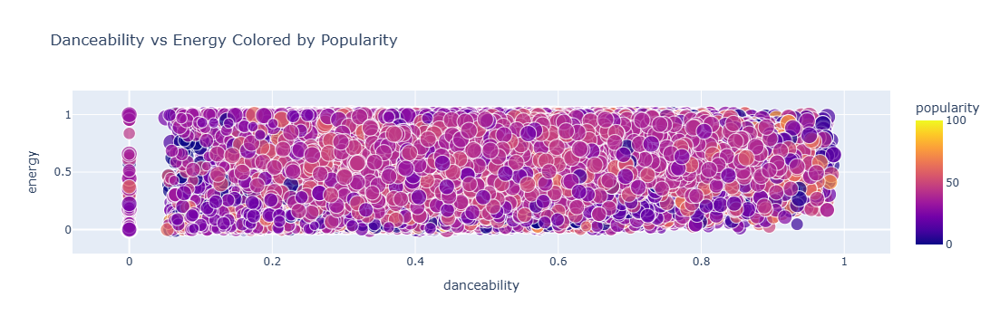

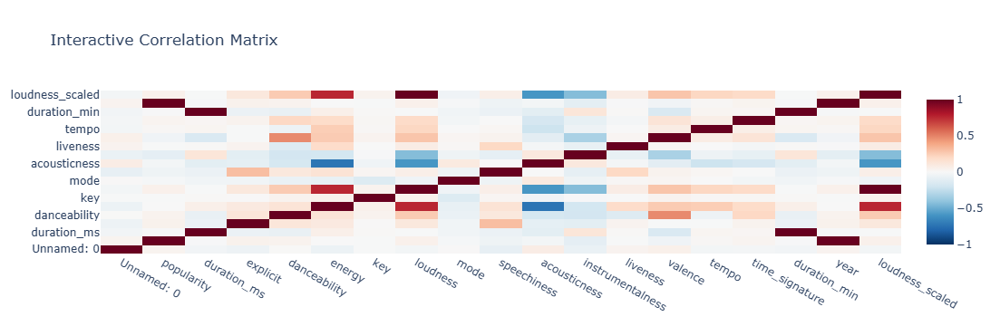

In [11]:
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd

# Fix loudness for bubble size (make positive)
spotify_df['loudness_scaled'] = spotify_df['loudness'] - spotify_df['loudness'].min() + 1

# =====================================
# 1. Interactive Scatter Plot
# =====================================
fig = px.scatter(
    spotify_df, 
    x='danceability', 
    y='energy', 
    color='popularity',          # popularity will control color
    size='loudness_scaled',      # now positive bubble size
    hover_data=['track_name', 'artists'], 
    title='Danceability vs Energy Colored by Popularity'
)
fig.show()

# =====================================
# 2. Interactive Correlation Matrix
# =====================================
# Calculate correlation matrix
corr_matrix = spotify_df.corr(numeric_only=True)

fig = go.Figure(
    data=go.Heatmap(
        z=corr_matrix.values,
        x=corr_matrix.columns,
        y=corr_matrix.index,
        colorscale='RdBu_r',
        zmin=-1, zmax=1
    )
)

fig.update_layout(title='Interactive Correlation Matrix')
fig.show()
